In [ ]:
import numpy as np
from torch.autograd import Variable
from torchvision import datasets
import torch.nn as nn
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
import torch.nn.functional as F
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau
import torchvision.transforms as tt
import torch.utils.data as data_utils
import torch
import glob
import collections
from torchvision.models import resnet18
import random
import matplotlib.pyplot as plt
import cv2
import string
from tqdm.notebook import tqdm

import os
from sklearn.model_selection import train_test_split
from PIL import Image
import pandas as pd
import skimage.io
from skimage.transform import resize


%matplotlib inline

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip '/content/drive/MyDrive/adb_pll/Captcha.zip'

Archive:  /content/drive/MyDrive/adb_pll/Captcha.zip
   creating: samples/
  inflating: samples/226md.png       
  inflating: samples/22d5n.png       
  inflating: samples/2356g.png       
  inflating: samples/23mdg.png       
  inflating: samples/23n88.png       
  inflating: samples/243mm.png       
  inflating: samples/244e2.png       
  inflating: samples/245y5.png       
  inflating: samples/24f6w.png       
  inflating: samples/24pew.png       
  inflating: samples/25257.png       
  inflating: samples/253dc.png       
  inflating: samples/25egp.png       
  inflating: samples/25m6p.png       
  inflating: samples/25p2m.png       
  inflating: samples/25w53.png       
  inflating: samples/264m5.png       
  inflating: samples/268g2.png       
  inflating: samples/28348.png       
  inflating: samples/28x47.png       
  inflating: samples/2b827.png       
  inflating: samples/2bg48.png       
  inflating: samples/2cegf.png       
  inflating: samples/2cg58.png       
  inflating: 

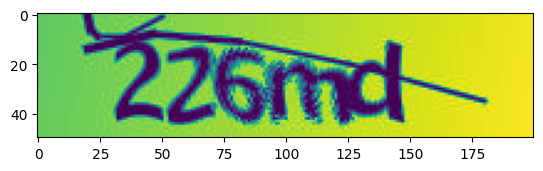

In [ ]:
image_to_show = Image.open('/content/samples/226md.png').convert('L')
plt.imshow(image_to_show)
None

In [ ]:
alphabet = 'abcdefghijklmnopqrstuvwxyz0123456789'

def char2idx(chars, max_lenght=None):
    idxs = []

    for i in chars:
        idxs.append(alphabet.index(i) + 1)

    return(idxs)

In [ ]:
class TrainDataset:
    def __init__(self, path, transform):
        self.path = path
        self.transform = transform

    def __len__(self):
        return len(os.listdir(self.path))

    def __getitem__(self, idx):
        filename = os.listdir(self.path)[idx]
        image = Image.open(self.path + '/' + filename).convert('L')
        label = torch.IntTensor(char2idx(filename[:-4]))

        if self.transform is not None:
            image = self.transform(image)

        return image, label

In [ ]:
path = '/content/samples'

transform = tt.Compose([
    tt.ToTensor()
])

batch_size = 16

train_dataset = TrainDataset(path, transform)
train_dataloader = DataLoader(
    train_dataset,
    batch_size=batch_size,
    shuffle=True,
    num_workers=2
    )

In [ ]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
device

device(type='cuda')

In [ ]:
class GaussianNoise(nn.Module):
    def __init__(self):
        super().__init__()

    def forward(self, x):
        return x + torch.empty_like(x).normal_(std=0.09)

#Generator

In [ ]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()

        self.noise = nn.Sequential(
            nn.Linear(100, 512*2*2, bias=False),
            nn.BatchNorm1d(512*2*2),
            nn.LeakyReLU(0.2, inplace=True)
            )

        self.label = nn.Embedding(36, 64) # Порядок сохраняется

        self.model = nn.Sequential(
            nn.ConvTranspose2d(2368, 64*7, (3, 4), (1, 2), 1, bias=True), # out: 64*7, 1, 2
            nn.BatchNorm2d(64*7),
            nn.LeakyReLU(0.2, inplace=True),
            nn.ConvTranspose2d(64*7, 64*6, (3, 4), (1, 2), 1, bias=False), # out: 64*6, 1, 4
            nn.BatchNorm2d(64*6),
            nn.LeakyReLU(0.2, inplace=True),
            nn.ConvTranspose2d(64*6, 64*5, 4, 2, 1, bias=False), # out: 64*5, 2, 8
            nn.BatchNorm2d(64*5),
            nn.LeakyReLU(0.2, inplace=True),
            nn.ConvTranspose2d(64*5, 64*4, 4, 2, 1,bias=False), # out: 64*4, 4, 16
            nn.BatchNorm2d(64*4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.ConvTranspose2d(64*4, 64*3, (4, 3), 2, (1, 4), bias=False), # out: 64*3, 8, 25
            nn.BatchNorm2d(64*3),
            nn.LeakyReLU(0.2, inplace=True),
            nn.ConvTranspose2d(64*3, 64*2, 4, 2, 1), # out: 64*2, 16, 50
            nn.BatchNorm2d(64*2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.ConvTranspose2d(64*2, 64*1, (3, 4), 2, (4, 1)), # out: 64*1, 25, 100
            nn.BatchNorm2d(64*1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.ConvTranspose2d(64*1, 1, 4, 2, 1), # out: 1, 50, 200
            nn.Tanh()
            )

    def forward(self, noise, label):
        noise = self.noise(noise)
        noise = noise.view(-1, 32, 8, 8)

        label = self.label(label)
        label = label.view(-1, 5, 8, 8)

        image_label = torch.cat((noise, label), dim=1)
        image_label = image_label.view(-1, 2368, 1, 1)

        image = self.model(image_label)

        return image

#Discriminator

In [ ]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()

        self.label = nn.Embedding(36, 2000) # Порядок сохраняется

        self.model = nn.Sequential(
            GaussianNoise(),
            nn.Conv2d(2, 64*1, 4, 2, 1, bias=True), # out: 64*1, 25, 100
            nn.BatchNorm2d(64*1),
            nn.LeakyReLU(0.2, inplace=True),
            GaussianNoise(),
            nn.Conv2d(64*1, 64*2, (3, 4), 2, (4, 1), bias=False), # out: 64*2, 16, 50
            nn.BatchNorm2d(64*2),
            nn.LeakyReLU(0.2, inplace=True),
            GaussianNoise(),
            nn.Conv2d(64*2, 64*3, 4, 2, 1, bias=False), # out: 64*3, 8, 25
            nn.BatchNorm2d(64*3),
            nn.LeakyReLU(0.2, inplace=True),
            GaussianNoise(),
            nn.Conv2d(64*3, 64*4, (4, 3), 2, (1, 4), bias=False), # out: 64*4, 4, 16
            nn.BatchNorm2d(64*4),
            nn.LeakyReLU(0.2, inplace=True),
            GaussianNoise(),
            nn.Conv2d(64*4, 64*5, 4, 2, 1, bias=False), # out: 64*5, 2, 8
            nn.BatchNorm2d(64*5),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Flatten(),
            GaussianNoise(),
            nn.Linear(64*5*16, 1),
            nn.Sigmoid()
            )

    def forward(self, image, label):
        label = self.label(label)
        label = label.view(-1, 1, 50, 200)

        image_label = torch.cat((image, label), 1)

        prediction = self.model(image_label)

        return prediction

In [ ]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

generator = Generator()
discriminator = Discriminator()

generator.apply(weights_init)
discriminator.apply(weights_init)

generator.to(device)
discriminator.to(device)

generator_optimizer = torch.optim.Adam(generator.parameters(), lr=2e-4, betas=(0.5, 0.999))
discriminator_optimizer = torch.optim.Adam(discriminator.parameters(), lr=2e-4, betas=(0.5, 0.999))

bce_criterion = nn.BCELoss()

In [ ]:
test_labels = torch.IntTensor([[1,2,3,4,5]]).to(device)
test_noise = torch.randn(1, 100).to(device)

In [ ]:
def train_epoch(epoch):

    discriminator_loss_per_epoch = []
    generator_bce_loss_per_epoch, generator_ctc_loss_per_epoch = [], []
    generator_loss_per_epoch = []

    for real_images, labels in tqdm(train_dataloader):
        noises = torch.randn(real_images.size(0), 100).to(device)
        real_images = real_images.to(device)
        labels = labels.to(device)

        generator_optimizer.zero_grad()

        fake_images = generator(noises, labels)
        discriminator_fake_preds = discriminator(fake_images, labels)

        generator_loss = bce_criterion(discriminator_fake_preds, torch.ones_like(discriminator_fake_preds).uniform_(0.9, 1.0))

        generator_loss_per_epoch.append(generator_loss.item())

        generator_loss.backward()
        generator_optimizer.step()

        discriminator_optimizer.zero_grad()

        discriminator_fake_preds = discriminator(fake_images.detach(), labels)
        discriminator_real_preds = discriminator(real_images, labels)

        discriminator_loss = bce_criterion(discriminator_real_preds, torch.ones_like(discriminator_real_preds).uniform_(0.9, 1.0)) + \
                             bce_criterion(discriminator_fake_preds, torch.empty_like(discriminator_fake_preds).uniform_(0.0, 0.1))

        discriminator_loss_per_epoch.append(discriminator_loss.item())

        discriminator_loss.backward()
        discriminator_optimizer.step()

    return generator_loss_per_epoch, discriminator_loss_per_epoch

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [1/400], loss_g: 1.1013, loss_d: 1.3389


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [2/400], loss_g: 0.7303, loss_d: 1.4570


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [3/400], loss_g: 0.7849, loss_d: 1.3964


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [4/400], loss_g: 0.8080, loss_d: 1.4274


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [5/400], loss_g: 0.8791, loss_d: 1.3222


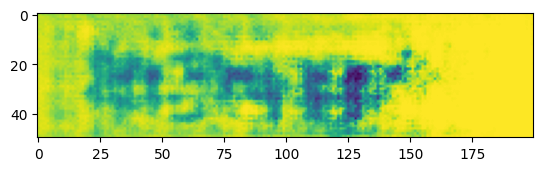

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [6/400], loss_g: 0.8811, loss_d: 1.3573


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [7/400], loss_g: 0.8044, loss_d: 1.3780


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [8/400], loss_g: 0.8706, loss_d: 1.3230


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [9/400], loss_g: 0.8651, loss_d: 1.2975


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [10/400], loss_g: 0.9444, loss_d: 1.2559


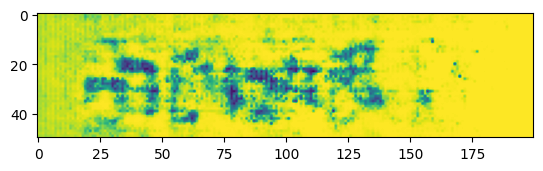

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [11/400], loss_g: 1.0393, loss_d: 1.1668


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [12/400], loss_g: 1.2819, loss_d: 1.0258


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [13/400], loss_g: 1.5198, loss_d: 0.9181


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [14/400], loss_g: 1.8487, loss_d: 0.7844


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [15/400], loss_g: 1.9388, loss_d: 0.7482


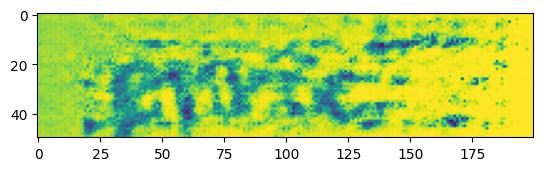

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [16/400], loss_g: 2.0413, loss_d: 0.6522


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [17/400], loss_g: 2.2988, loss_d: 0.6344


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [18/400], loss_g: 2.1767, loss_d: 0.6531


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [19/400], loss_g: 2.2905, loss_d: 0.7326


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [20/400], loss_g: 2.1741, loss_d: 0.7625


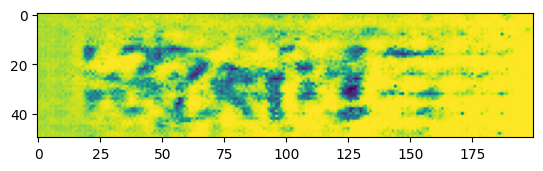

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [21/400], loss_g: 2.3064, loss_d: 0.6830


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [22/400], loss_g: 2.2900, loss_d: 0.6320


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [23/400], loss_g: 2.3859, loss_d: 0.6390


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [24/400], loss_g: 2.3203, loss_d: 0.6157


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [25/400], loss_g: 2.3497, loss_d: 0.5965


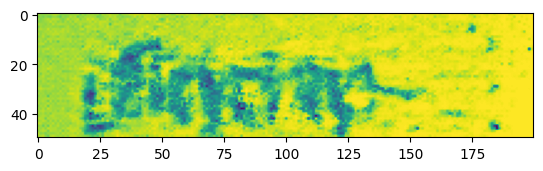

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [26/400], loss_g: 2.5079, loss_d: 0.6012


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [27/400], loss_g: 2.6251, loss_d: 0.6769


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [28/400], loss_g: 2.4925, loss_d: 0.6025


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [29/400], loss_g: 2.3907, loss_d: 0.7322


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [30/400], loss_g: 2.4074, loss_d: 0.5501


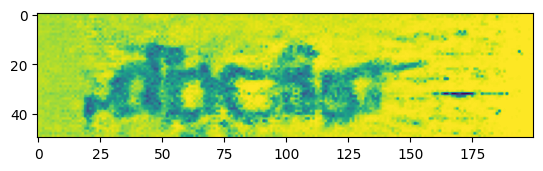

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [31/400], loss_g: 2.5687, loss_d: 0.6198


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [32/400], loss_g: 2.5922, loss_d: 0.5885


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [33/400], loss_g: 2.6533, loss_d: 0.5506


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [34/400], loss_g: 2.7082, loss_d: 0.6715


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [35/400], loss_g: 2.5135, loss_d: 0.5375


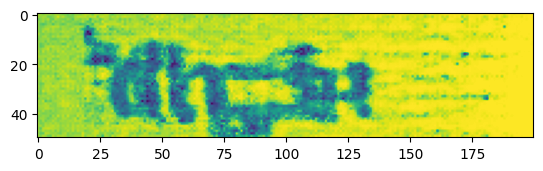

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [36/400], loss_g: 2.7079, loss_d: 0.5537


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [37/400], loss_g: 2.5261, loss_d: 0.5421


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [38/400], loss_g: 2.6588, loss_d: 0.5355


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [39/400], loss_g: 2.7383, loss_d: 0.5073


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [40/400], loss_g: 2.7969, loss_d: 0.5925


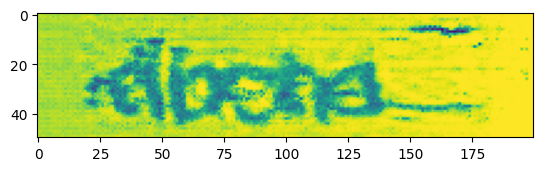

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [41/400], loss_g: 2.7647, loss_d: 0.5706


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [42/400], loss_g: 2.6838, loss_d: 0.5226


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [43/400], loss_g: 2.8065, loss_d: 0.4970


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [44/400], loss_g: 2.9087, loss_d: 0.5134


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [45/400], loss_g: 3.0167, loss_d: 0.5253


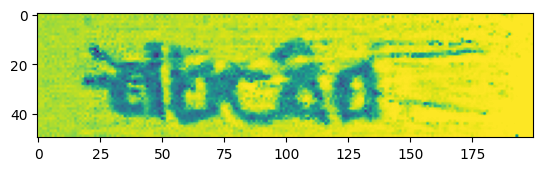

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [46/400], loss_g: 2.7069, loss_d: 0.4995


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [47/400], loss_g: 2.7151, loss_d: 0.4928


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [48/400], loss_g: 2.8156, loss_d: 0.5571


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [49/400], loss_g: 2.6297, loss_d: 0.6246


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [50/400], loss_g: 2.6027, loss_d: 0.4698


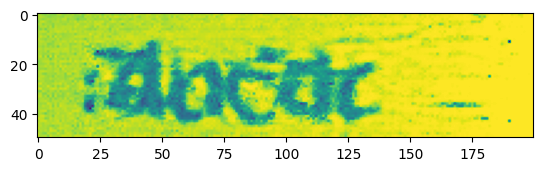

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [51/400], loss_g: 2.8481, loss_d: 0.4822


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [52/400], loss_g: 2.8506, loss_d: 0.4974


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [53/400], loss_g: 2.8309, loss_d: 0.4920


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [54/400], loss_g: 2.8208, loss_d: 0.4832


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [55/400], loss_g: 2.8624, loss_d: 0.4758


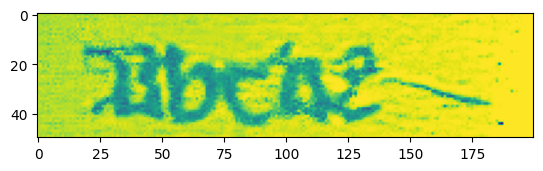

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [56/400], loss_g: 2.7547, loss_d: 0.4821


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [57/400], loss_g: 2.9267, loss_d: 0.5170


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [58/400], loss_g: 2.8084, loss_d: 0.4693


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [59/400], loss_g: 2.8230, loss_d: 0.5001


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [60/400], loss_g: 2.8361, loss_d: 0.5242


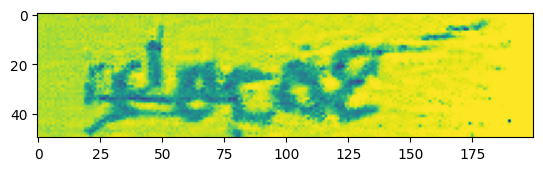

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [61/400], loss_g: 2.8526, loss_d: 0.4668


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [62/400], loss_g: 2.9067, loss_d: 0.4709


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [63/400], loss_g: 2.8444, loss_d: 0.4815


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [64/400], loss_g: 2.8057, loss_d: 0.4528


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [65/400], loss_g: 2.9670, loss_d: 0.4874


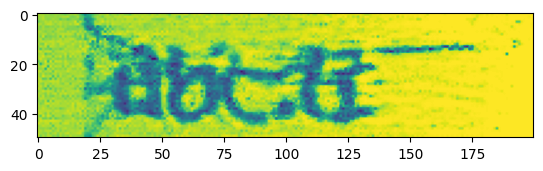

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [66/400], loss_g: 2.8469, loss_d: 0.4592


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [67/400], loss_g: 2.8622, loss_d: 0.4689


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [68/400], loss_g: 2.7604, loss_d: 0.4482


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [69/400], loss_g: 3.0281, loss_d: 0.4940


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [70/400], loss_g: 2.8223, loss_d: 0.4557


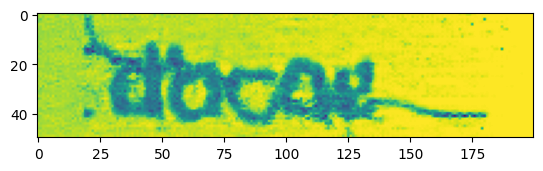

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [71/400], loss_g: 2.9699, loss_d: 0.4743


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [72/400], loss_g: 2.9340, loss_d: 0.4621


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [73/400], loss_g: 2.9573, loss_d: 0.4630


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [74/400], loss_g: 3.0276, loss_d: 0.4995


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [75/400], loss_g: 2.8690, loss_d: 0.4616


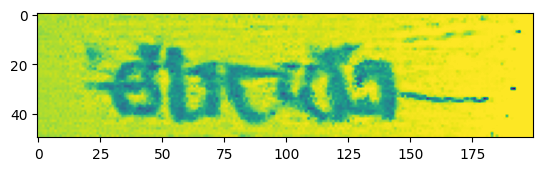

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [76/400], loss_g: 2.8569, loss_d: 0.4336


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [77/400], loss_g: 3.0308, loss_d: 0.4428


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [78/400], loss_g: 3.0507, loss_d: 0.4379


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [79/400], loss_g: 2.9777, loss_d: 0.4344


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [80/400], loss_g: 2.9577, loss_d: 0.4285


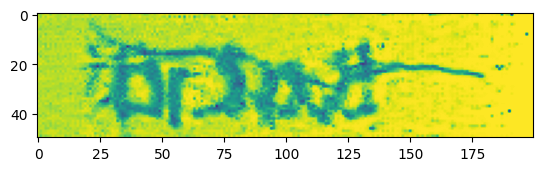

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [81/400], loss_g: 2.9503, loss_d: 0.4268


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [82/400], loss_g: 3.0086, loss_d: 0.4294


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [83/400], loss_g: 3.0402, loss_d: 0.4299


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [84/400], loss_g: 2.8873, loss_d: 0.4238


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [85/400], loss_g: 2.9622, loss_d: 0.4323


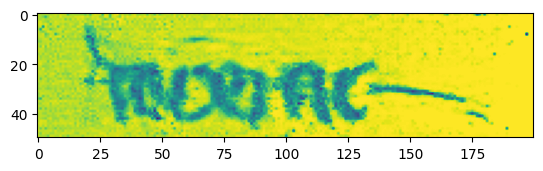

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [86/400], loss_g: 3.0282, loss_d: 0.4304


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [87/400], loss_g: 2.8834, loss_d: 0.4315


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [88/400], loss_g: 2.9957, loss_d: 0.4236


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [89/400], loss_g: 2.9639, loss_d: 0.4248


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [90/400], loss_g: 3.0164, loss_d: 0.4164


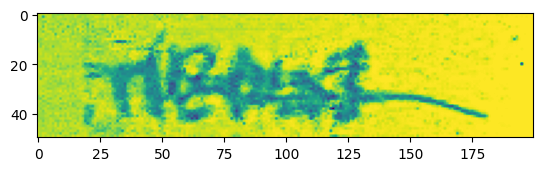

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [91/400], loss_g: 2.9375, loss_d: 0.4309


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [92/400], loss_g: 2.9546, loss_d: 0.4335


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [93/400], loss_g: 2.8981, loss_d: 0.4321


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [94/400], loss_g: 2.9229, loss_d: 0.4444


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [95/400], loss_g: 2.9470, loss_d: 0.4431


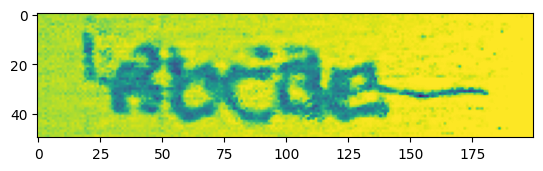

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [96/400], loss_g: 3.0206, loss_d: 0.6749


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [97/400], loss_g: 2.9496, loss_d: 0.4652


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [98/400], loss_g: 2.9835, loss_d: 0.4415


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [99/400], loss_g: 2.9323, loss_d: 0.4340


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [100/400], loss_g: 2.9089, loss_d: 0.4363


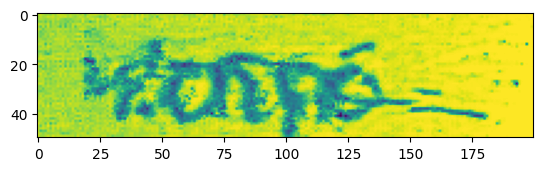

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [101/400], loss_g: 2.9296, loss_d: 0.4287


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [102/400], loss_g: 2.9497, loss_d: 0.4153


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [103/400], loss_g: 2.9831, loss_d: 0.4319


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [104/400], loss_g: 2.9428, loss_d: 0.4311


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [105/400], loss_g: 2.8602, loss_d: 0.4278


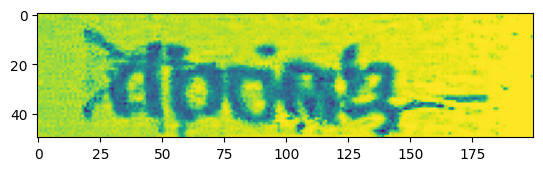

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [106/400], loss_g: 2.8617, loss_d: 0.4344


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [107/400], loss_g: 2.9771, loss_d: 0.5203


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [108/400], loss_g: 2.8752, loss_d: 0.5233


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [109/400], loss_g: 2.8549, loss_d: 0.4597


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [110/400], loss_g: 2.9081, loss_d: 0.4411


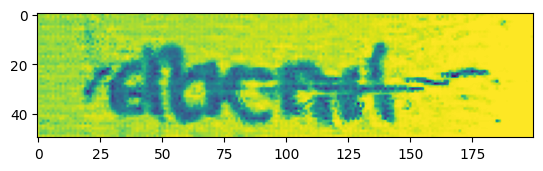

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [111/400], loss_g: 2.9136, loss_d: 0.4711


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [112/400], loss_g: 2.9115, loss_d: 0.4313


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [113/400], loss_g: 3.0037, loss_d: 0.4523


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [114/400], loss_g: 2.9445, loss_d: 0.4601


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [115/400], loss_g: 2.8963, loss_d: 0.4529


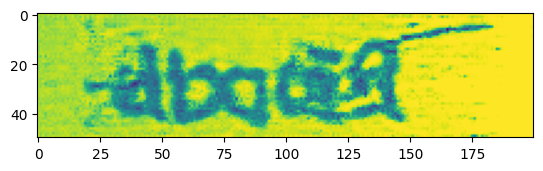

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [116/400], loss_g: 2.8298, loss_d: 0.4412


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [117/400], loss_g: 2.9009, loss_d: 0.4307


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [118/400], loss_g: 2.9337, loss_d: 0.4719


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [119/400], loss_g: 3.0579, loss_d: 0.4731


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [120/400], loss_g: 2.8355, loss_d: 0.4364


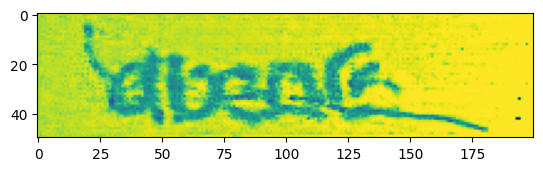

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [121/400], loss_g: 2.9575, loss_d: 0.4441


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [122/400], loss_g: 2.9567, loss_d: 0.4718


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [123/400], loss_g: 3.0122, loss_d: 0.4693


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [124/400], loss_g: 2.9004, loss_d: 0.4413


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [125/400], loss_g: 2.9478, loss_d: 0.4335


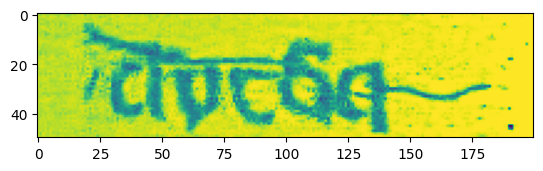

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [126/400], loss_g: 2.9590, loss_d: 0.4344


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [127/400], loss_g: 2.9177, loss_d: 0.4403


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [128/400], loss_g: 3.0038, loss_d: 0.4422


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [129/400], loss_g: 2.9372, loss_d: 0.4622


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [130/400], loss_g: 2.8848, loss_d: 0.4344


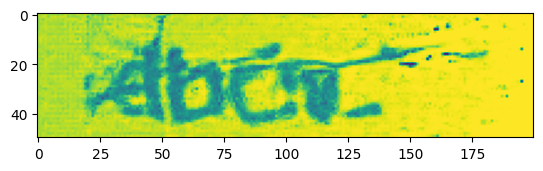

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [131/400], loss_g: 3.0692, loss_d: 0.4596


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [132/400], loss_g: 2.9025, loss_d: 0.4715


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [133/400], loss_g: 2.9885, loss_d: 0.4608


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [134/400], loss_g: 2.8407, loss_d: 0.4608


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [135/400], loss_g: 2.9395, loss_d: 0.4445


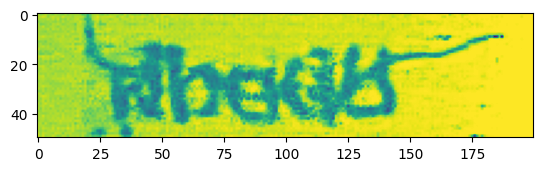

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [136/400], loss_g: 2.8574, loss_d: 0.4473


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [137/400], loss_g: 2.9591, loss_d: 0.4482


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [138/400], loss_g: 2.8265, loss_d: 0.4414


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [139/400], loss_g: 2.9876, loss_d: 0.4449


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [140/400], loss_g: 2.9414, loss_d: 0.4293


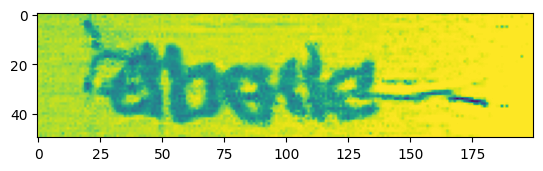

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [141/400], loss_g: 2.9858, loss_d: 0.4408


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [142/400], loss_g: 2.9190, loss_d: 0.4427


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [143/400], loss_g: 2.8862, loss_d: 0.4467


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [144/400], loss_g: 2.8967, loss_d: 0.4331


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [145/400], loss_g: 3.0220, loss_d: 0.4566


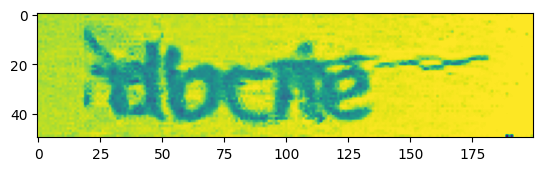

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [146/400], loss_g: 2.8547, loss_d: 0.4385


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [147/400], loss_g: 2.9754, loss_d: 0.4569


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [148/400], loss_g: 2.9429, loss_d: 0.4331


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [149/400], loss_g: 2.9543, loss_d: 0.4447


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [150/400], loss_g: 2.9083, loss_d: 0.4387


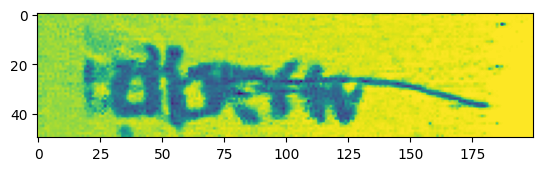

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [151/400], loss_g: 2.8765, loss_d: 0.4330


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [152/400], loss_g: 2.9989, loss_d: 0.4544


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [153/400], loss_g: 2.8700, loss_d: 0.4212


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [154/400], loss_g: 2.9058, loss_d: 0.4400


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [155/400], loss_g: 2.9345, loss_d: 0.4325


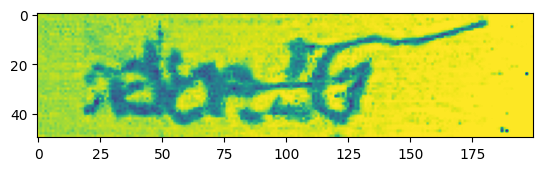

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [156/400], loss_g: 2.8783, loss_d: 0.4371


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [157/400], loss_g: 2.9731, loss_d: 0.4483


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [158/400], loss_g: 2.9392, loss_d: 0.5630


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [159/400], loss_g: 2.8070, loss_d: 0.4755


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [160/400], loss_g: 2.9269, loss_d: 0.4544


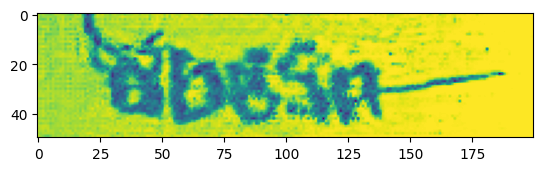

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [161/400], loss_g: 2.9473, loss_d: 0.4485


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [162/400], loss_g: 2.9029, loss_d: 0.4257


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [163/400], loss_g: 2.8485, loss_d: 0.4204


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [164/400], loss_g: 2.9169, loss_d: 0.4399


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [165/400], loss_g: 2.8212, loss_d: 0.6513


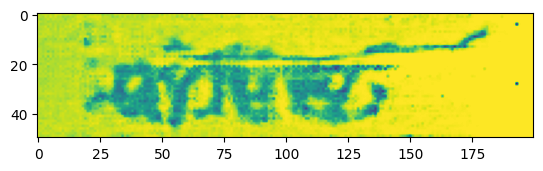

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [166/400], loss_g: 2.9474, loss_d: 0.4893


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [167/400], loss_g: 2.7994, loss_d: 0.4525


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [168/400], loss_g: 2.8433, loss_d: 0.4353


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [169/400], loss_g: 2.9166, loss_d: 0.4378


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [170/400], loss_g: 2.8653, loss_d: 0.4319


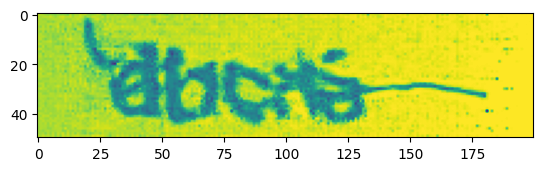

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [171/400], loss_g: 2.9564, loss_d: 0.4422


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [172/400], loss_g: 2.8415, loss_d: 0.4315


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [173/400], loss_g: 2.9284, loss_d: 0.4440


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [174/400], loss_g: 3.0104, loss_d: 0.4420


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [175/400], loss_g: 3.0048, loss_d: 0.4499


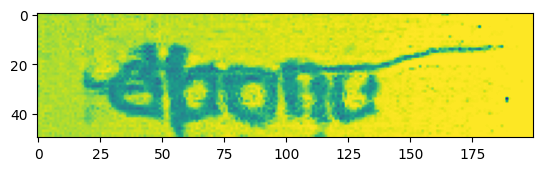

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [176/400], loss_g: 2.8590, loss_d: 0.4350


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [177/400], loss_g: 2.9133, loss_d: 0.4382


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [178/400], loss_g: 2.8360, loss_d: 0.4475


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [179/400], loss_g: 2.9215, loss_d: 0.4461


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [180/400], loss_g: 2.9435, loss_d: 0.4749


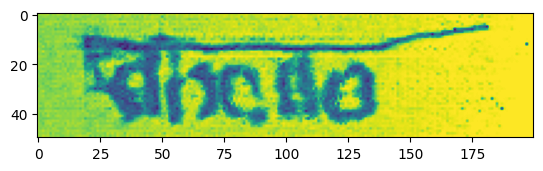

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [181/400], loss_g: 2.9028, loss_d: 0.4554


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [182/400], loss_g: 2.9438, loss_d: 0.4786


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [183/400], loss_g: 2.8165, loss_d: 0.4783


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [184/400], loss_g: 2.8628, loss_d: 0.4530


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [185/400], loss_g: 2.9541, loss_d: 0.4495


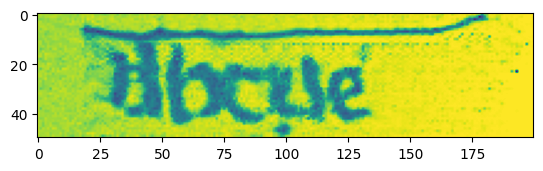

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [186/400], loss_g: 2.8718, loss_d: 0.4627


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [187/400], loss_g: 2.7510, loss_d: 0.6147


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [188/400], loss_g: 2.7438, loss_d: 0.5664


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [189/400], loss_g: 2.7366, loss_d: 0.4671


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [190/400], loss_g: 2.7868, loss_d: 0.4527


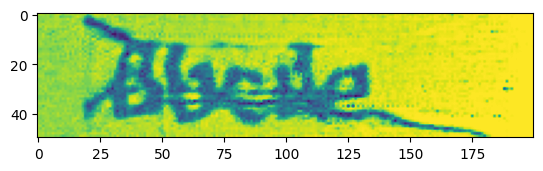

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [191/400], loss_g: 2.8678, loss_d: 0.4604


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [192/400], loss_g: 2.8787, loss_d: 0.4486


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [193/400], loss_g: 2.8957, loss_d: 0.4442


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [194/400], loss_g: 2.8088, loss_d: 0.4698


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [195/400], loss_g: 2.8877, loss_d: 0.4419


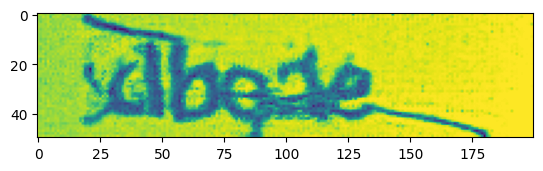

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [196/400], loss_g: 2.9059, loss_d: 0.4835


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [197/400], loss_g: 2.7331, loss_d: 0.4764


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [198/400], loss_g: 2.8455, loss_d: 0.4515


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [199/400], loss_g: 2.8221, loss_d: 0.4789


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [200/400], loss_g: 2.8657, loss_d: 0.4810


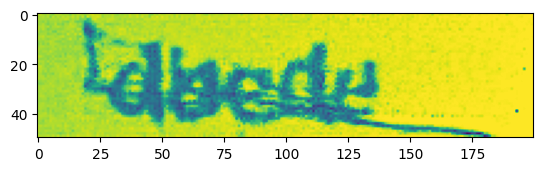

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [201/400], loss_g: 2.8372, loss_d: 0.4670


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [202/400], loss_g: 2.7216, loss_d: 0.5298


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [203/400], loss_g: 2.9361, loss_d: 0.4559


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [204/400], loss_g: 2.9249, loss_d: 0.4386


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [205/400], loss_g: 2.9463, loss_d: 0.4574


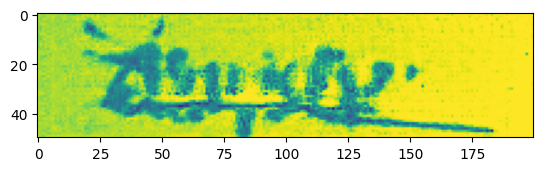

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [206/400], loss_g: 2.8354, loss_d: 0.4662


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [207/400], loss_g: 2.9503, loss_d: 0.4452


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [208/400], loss_g: 2.8926, loss_d: 0.4417


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [209/400], loss_g: 2.8945, loss_d: 0.4467


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [210/400], loss_g: 2.8547, loss_d: 0.4778


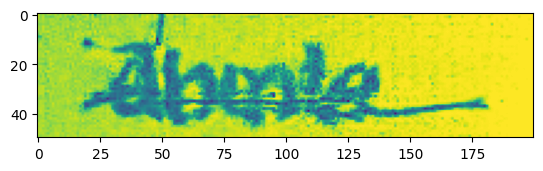

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [211/400], loss_g: 2.8384, loss_d: 0.4702


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [212/400], loss_g: 2.8309, loss_d: 0.4516


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [213/400], loss_g: 2.8975, loss_d: 0.4531


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [214/400], loss_g: 2.9304, loss_d: 0.4526


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [215/400], loss_g: 2.9227, loss_d: 0.4865


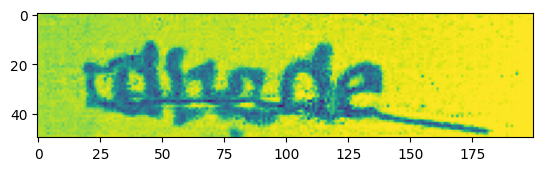

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [216/400], loss_g: 2.8893, loss_d: 0.4628


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [217/400], loss_g: 2.8325, loss_d: 0.4632


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [218/400], loss_g: 2.8734, loss_d: 0.4672


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [219/400], loss_g: 2.8600, loss_d: 0.4456


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [220/400], loss_g: 2.7740, loss_d: 0.4686


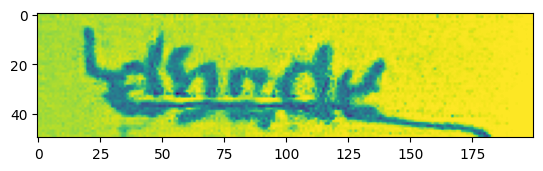

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [221/400], loss_g: 2.8339, loss_d: 0.5409


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [222/400], loss_g: 2.7071, loss_d: 0.5277


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [223/400], loss_g: 2.7967, loss_d: 0.4642


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [224/400], loss_g: 2.8645, loss_d: 0.4549


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [225/400], loss_g: 2.8710, loss_d: 0.5131


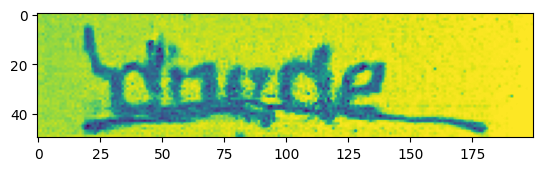

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [226/400], loss_g: 2.6799, loss_d: 0.6674


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [227/400], loss_g: 2.6451, loss_d: 0.4661


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [228/400], loss_g: 2.8045, loss_d: 0.4665


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [229/400], loss_g: 2.7800, loss_d: 0.4358


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [230/400], loss_g: 2.8881, loss_d: 0.4483


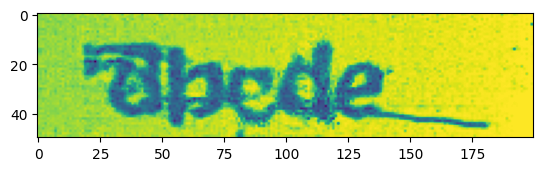

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [231/400], loss_g: 2.8691, loss_d: 0.4591


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [232/400], loss_g: 2.7797, loss_d: 0.4574


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [233/400], loss_g: 2.8580, loss_d: 0.4572


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [234/400], loss_g: 2.9205, loss_d: 0.4533


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [235/400], loss_g: 2.9122, loss_d: 0.4504


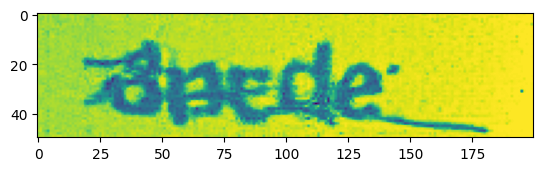

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [236/400], loss_g: 2.8873, loss_d: 0.4344


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [237/400], loss_g: 2.9761, loss_d: 0.4351


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [238/400], loss_g: 2.8405, loss_d: 0.4547


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [239/400], loss_g: 2.8131, loss_d: 0.4680


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [240/400], loss_g: 2.8610, loss_d: 0.4576


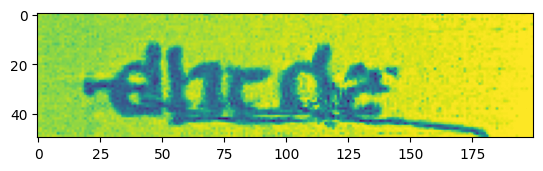

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [241/400], loss_g: 2.8299, loss_d: 0.4443


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [242/400], loss_g: 2.8940, loss_d: 0.4610


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [243/400], loss_g: 2.8679, loss_d: 0.4435


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [244/400], loss_g: 2.8753, loss_d: 0.4388


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [245/400], loss_g: 2.8769, loss_d: 0.4562


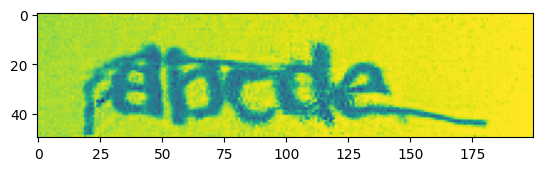

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [246/400], loss_g: 2.7835, loss_d: 0.4697


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [247/400], loss_g: 2.8385, loss_d: 0.4529


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [248/400], loss_g: 2.9349, loss_d: 0.4565


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [249/400], loss_g: 2.7937, loss_d: 0.4650


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [250/400], loss_g: 2.9437, loss_d: 0.4512


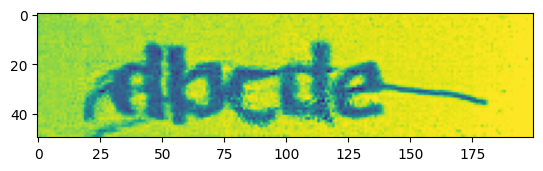

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [251/400], loss_g: 2.8639, loss_d: 0.4696


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [252/400], loss_g: 2.9574, loss_d: 0.4400


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [253/400], loss_g: 2.8520, loss_d: 0.4403


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [254/400], loss_g: 2.8242, loss_d: 0.4788


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [255/400], loss_g: 2.8492, loss_d: 0.4589


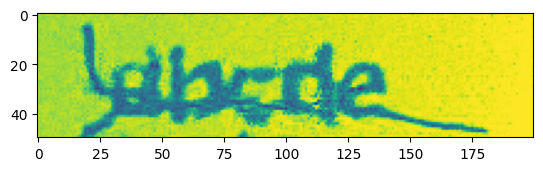

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [256/400], loss_g: 2.8828, loss_d: 0.4434


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [257/400], loss_g: 2.9291, loss_d: 0.5396


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [258/400], loss_g: 2.8261, loss_d: 0.4562


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [259/400], loss_g: 2.8638, loss_d: 0.4484


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [260/400], loss_g: 2.9539, loss_d: 0.4386


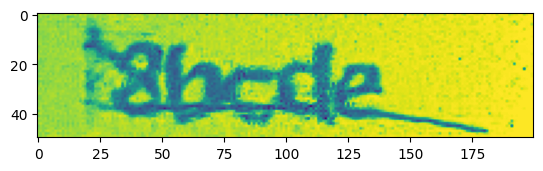

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [261/400], loss_g: 3.0406, loss_d: 0.4419


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [262/400], loss_g: 2.9398, loss_d: 0.4383


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [263/400], loss_g: 2.8579, loss_d: 0.4356


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [264/400], loss_g: 2.8815, loss_d: 0.4464


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [265/400], loss_g: 2.9407, loss_d: 0.4455


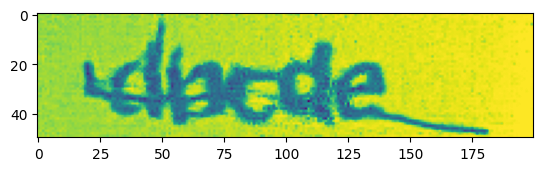

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [266/400], loss_g: 2.8429, loss_d: 0.4513


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [267/400], loss_g: 2.8535, loss_d: 0.4659


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [268/400], loss_g: 2.8694, loss_d: 0.4461


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [269/400], loss_g: 2.8411, loss_d: 0.4499


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [270/400], loss_g: 2.7586, loss_d: 0.5421


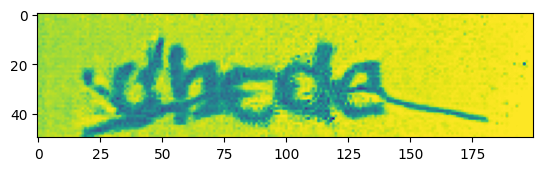

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [271/400], loss_g: 2.8127, loss_d: 0.4621


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [272/400], loss_g: 2.8971, loss_d: 0.4431


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [273/400], loss_g: 2.8363, loss_d: 0.4544


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [274/400], loss_g: 2.9354, loss_d: 0.4406


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [275/400], loss_g: 2.8843, loss_d: 0.4467


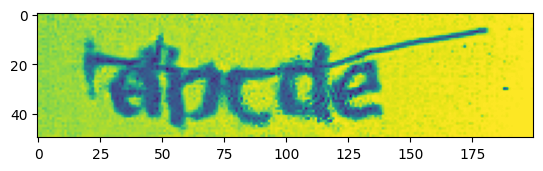

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [276/400], loss_g: 2.8716, loss_d: 0.4362


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [277/400], loss_g: 2.9226, loss_d: 0.4717


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [278/400], loss_g: 2.8505, loss_d: 0.4343


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [279/400], loss_g: 2.8452, loss_d: 0.4419


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [280/400], loss_g: 2.8672, loss_d: 0.4415


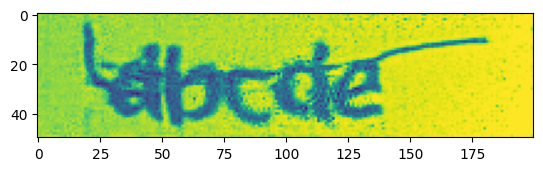

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [281/400], loss_g: 2.9221, loss_d: 0.4494


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [282/400], loss_g: 2.9313, loss_d: 0.4738


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [283/400], loss_g: 2.9137, loss_d: 0.4486


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [284/400], loss_g: 2.8969, loss_d: 0.4461


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [285/400], loss_g: 2.9013, loss_d: 0.4624


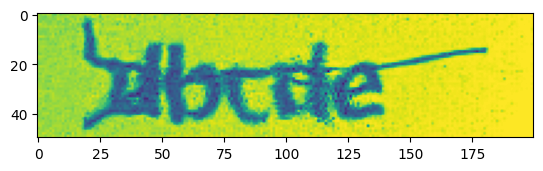

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [286/400], loss_g: 2.9178, loss_d: 0.4474


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [287/400], loss_g: 2.9090, loss_d: 0.4410


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [288/400], loss_g: 2.9876, loss_d: 0.4600


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [289/400], loss_g: 2.7574, loss_d: 0.4532


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [290/400], loss_g: 2.8058, loss_d: 0.4728


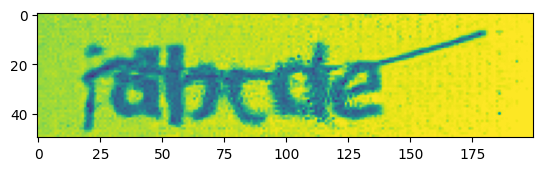

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [291/400], loss_g: 2.8936, loss_d: 0.4691


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [292/400], loss_g: 2.8220, loss_d: 0.4399


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [293/400], loss_g: 2.9169, loss_d: 0.4411


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [294/400], loss_g: 2.8704, loss_d: 0.5046


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [295/400], loss_g: 2.8585, loss_d: 0.4545


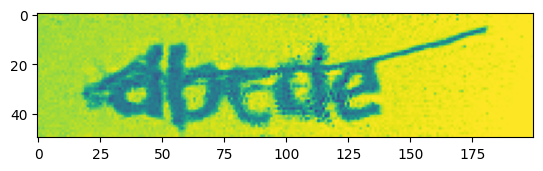

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [296/400], loss_g: 2.9493, loss_d: 0.4493


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [297/400], loss_g: 2.9111, loss_d: 0.4377


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [298/400], loss_g: 3.0033, loss_d: 0.4380


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [299/400], loss_g: 2.9430, loss_d: 0.4359


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [300/400], loss_g: 2.9012, loss_d: 0.4415


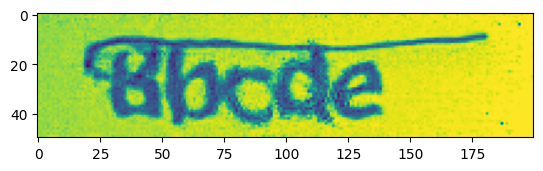

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [301/400], loss_g: 2.8916, loss_d: 0.4198


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [302/400], loss_g: 2.8540, loss_d: 0.4246


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [303/400], loss_g: 2.8965, loss_d: 0.4268


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [304/400], loss_g: 2.9128, loss_d: 0.4390


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [305/400], loss_g: 2.8748, loss_d: 0.5598


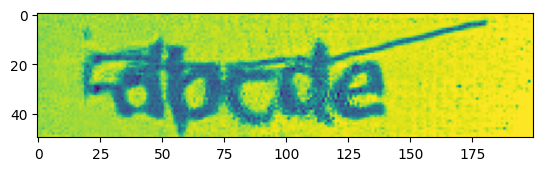

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [306/400], loss_g: 2.7909, loss_d: 0.4686


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [307/400], loss_g: 2.8162, loss_d: 0.4523


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [308/400], loss_g: 2.8368, loss_d: 0.5294


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [309/400], loss_g: 2.5873, loss_d: 0.4721


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [310/400], loss_g: 2.8267, loss_d: 0.4733


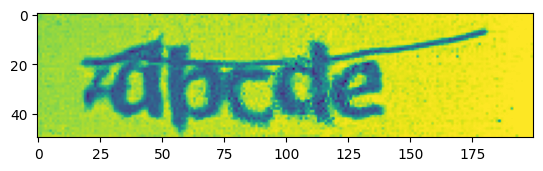

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [311/400], loss_g: 2.9114, loss_d: 0.4333


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [312/400], loss_g: 2.8925, loss_d: 0.4313


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [313/400], loss_g: 2.8543, loss_d: 0.4287


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [314/400], loss_g: 2.7991, loss_d: 0.4412


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [315/400], loss_g: 2.8821, loss_d: 0.4360


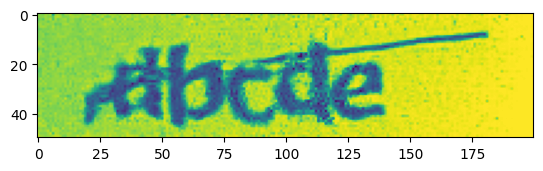

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [316/400], loss_g: 2.8802, loss_d: 0.4459


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [317/400], loss_g: 2.9282, loss_d: 0.4322


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [318/400], loss_g: 2.9457, loss_d: 0.4336


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [319/400], loss_g: 2.9341, loss_d: 0.4387


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [320/400], loss_g: 2.8489, loss_d: 0.4322


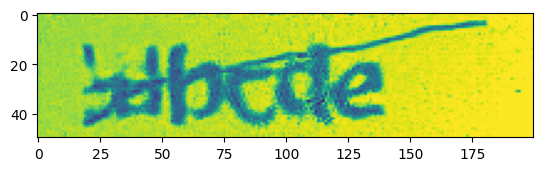

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [321/400], loss_g: 2.8928, loss_d: 0.4332


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [322/400], loss_g: 2.9087, loss_d: 0.4363


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [323/400], loss_g: 2.9130, loss_d: 0.4383


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [324/400], loss_g: 2.9315, loss_d: 0.4316


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [325/400], loss_g: 3.0067, loss_d: 0.4599


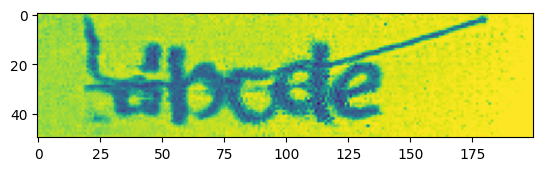

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [326/400], loss_g: 2.8552, loss_d: 0.4384


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [327/400], loss_g: 2.9381, loss_d: 0.4499


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [328/400], loss_g: 3.0181, loss_d: 0.4406


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [329/400], loss_g: 2.9091, loss_d: 0.4267


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [330/400], loss_g: 2.8942, loss_d: 0.4373


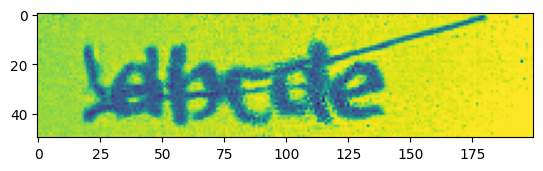

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [331/400], loss_g: 2.8583, loss_d: 0.4493


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [332/400], loss_g: 2.8231, loss_d: 0.4505


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [333/400], loss_g: 2.9635, loss_d: 0.4454


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [334/400], loss_g: 2.8941, loss_d: 0.4345


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [335/400], loss_g: 2.9677, loss_d: 0.4449


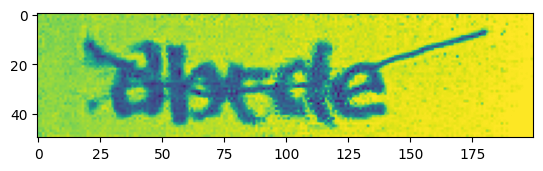

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [336/400], loss_g: 2.8735, loss_d: 0.4240


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [337/400], loss_g: 2.8915, loss_d: 0.4346


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [338/400], loss_g: 3.0474, loss_d: 0.4495


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [339/400], loss_g: 2.9288, loss_d: 0.4385


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [340/400], loss_g: 2.9009, loss_d: 0.4422


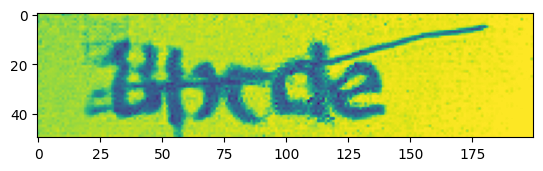

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [341/400], loss_g: 2.9177, loss_d: 0.4355


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [342/400], loss_g: 3.0119, loss_d: 0.4415


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [343/400], loss_g: 2.8796, loss_d: 0.4341


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [344/400], loss_g: 2.9556, loss_d: 0.4704


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [345/400], loss_g: 2.8400, loss_d: 0.4322


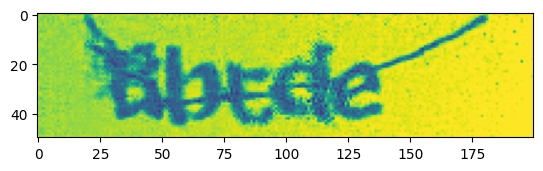

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [346/400], loss_g: 2.9298, loss_d: 0.4381


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [347/400], loss_g: 2.9323, loss_d: 0.4440


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [348/400], loss_g: 2.8527, loss_d: 0.4356


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [349/400], loss_g: 2.8908, loss_d: 0.4301


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [350/400], loss_g: 2.9433, loss_d: 0.4279


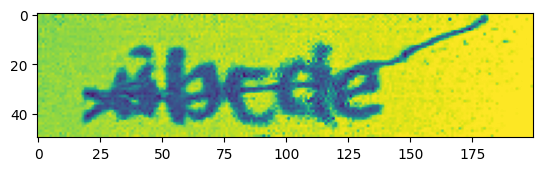

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [351/400], loss_g: 2.8775, loss_d: 0.4364


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [352/400], loss_g: 2.9321, loss_d: 0.4449


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [353/400], loss_g: 2.9192, loss_d: 0.4334


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [354/400], loss_g: 2.9617, loss_d: 0.4402


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [355/400], loss_g: 2.8777, loss_d: 0.4339


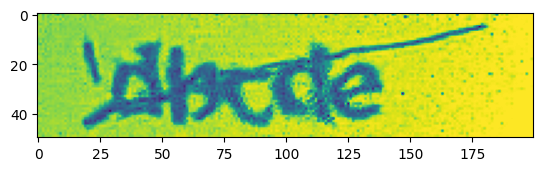

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [356/400], loss_g: 2.8969, loss_d: 0.4468


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [357/400], loss_g: 2.8657, loss_d: 0.4367


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [358/400], loss_g: 2.9114, loss_d: 0.4307


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [359/400], loss_g: 2.8564, loss_d: 0.4329


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [360/400], loss_g: 2.8935, loss_d: 0.4315


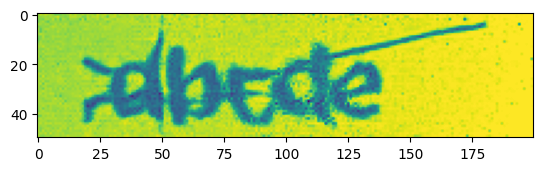

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [361/400], loss_g: 2.9465, loss_d: 0.4312


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [362/400], loss_g: 2.8530, loss_d: 0.4438


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [363/400], loss_g: 2.8847, loss_d: 0.4234


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [364/400], loss_g: 2.9032, loss_d: 0.4313


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [365/400], loss_g: 2.9224, loss_d: 0.4393


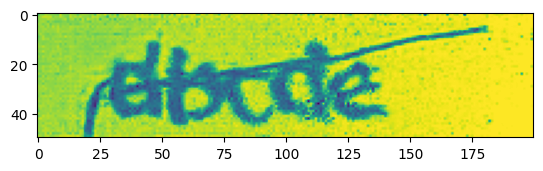

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [366/400], loss_g: 2.8784, loss_d: 0.4309


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [367/400], loss_g: 2.8799, loss_d: 0.4365


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [368/400], loss_g: 2.8443, loss_d: 0.4890


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [369/400], loss_g: 2.9314, loss_d: 0.4316


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [370/400], loss_g: 2.8873, loss_d: 0.4502


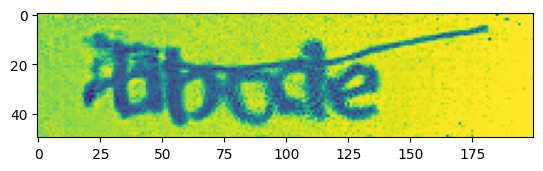

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [371/400], loss_g: 2.8527, loss_d: 0.4448


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [372/400], loss_g: 2.9550, loss_d: 0.4373


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [373/400], loss_g: 2.9083, loss_d: 0.4628


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [374/400], loss_g: 2.8730, loss_d: 0.4283


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [375/400], loss_g: 2.8918, loss_d: 0.4403


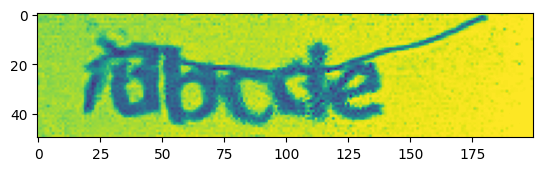

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [376/400], loss_g: 2.9686, loss_d: 0.4486


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [377/400], loss_g: 2.9719, loss_d: 0.4306


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [378/400], loss_g: 2.8900, loss_d: 0.4269


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [379/400], loss_g: 2.8799, loss_d: 0.4239


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [380/400], loss_g: 2.9038, loss_d: 0.4384


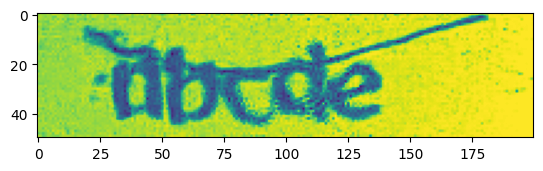

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [381/400], loss_g: 2.9393, loss_d: 0.4276


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [382/400], loss_g: 2.8656, loss_d: 0.4232


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [383/400], loss_g: 2.9918, loss_d: 0.4381


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [384/400], loss_g: 2.9540, loss_d: 0.4349


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [385/400], loss_g: 2.8572, loss_d: 0.4359


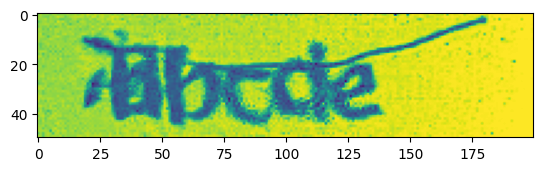

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [386/400], loss_g: 2.8603, loss_d: 0.4227


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [387/400], loss_g: 2.9142, loss_d: 0.4228


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [388/400], loss_g: 2.9353, loss_d: 0.4365


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [389/400], loss_g: 2.9336, loss_d: 0.4238


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [390/400], loss_g: 2.9164, loss_d: 0.4419


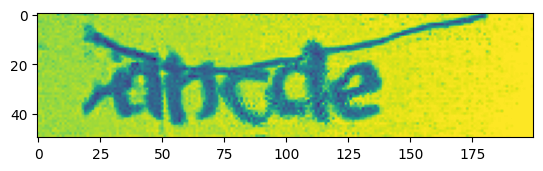

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [391/400], loss_g: 2.8909, loss_d: 0.4525


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [392/400], loss_g: 2.9164, loss_d: 0.4567


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [393/400], loss_g: 2.9336, loss_d: 0.4396


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [394/400], loss_g: 2.8440, loss_d: 0.4293


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [395/400], loss_g: 2.8888, loss_d: 0.4478


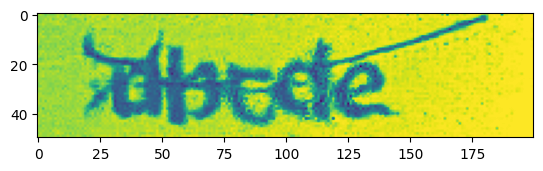

  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [396/400], loss_g: 2.9123, loss_d: 0.4249


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [397/400], loss_g: 2.9150, loss_d: 0.4326


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [398/400], loss_g: 2.8949, loss_d: 0.4220


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [399/400], loss_g: 2.9261, loss_d: 0.4287


  0%|          | 0/67 [00:00<?, ?it/s]

Epoch [400/400], loss_g: 2.9168, loss_d: 0.4351


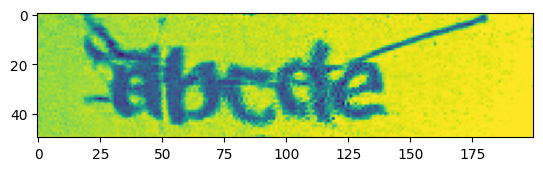

In [ ]:
epochs = 400

generator_losses, discriminator_losses = [], []

for epoch in range(epochs):
    generator_loss_per_epoch, discriminator_loss_per_epoch = train_epoch(epoch)

    generator_losses.append(np.mean(generator_loss_per_epoch))
    discriminator_losses.append(np.mean(discriminator_loss_per_epoch))

    print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}".format(
          epoch+1,
          epochs,
          generator_losses[-1],
          discriminator_losses[-1]))

    if (epoch+1) % 5 == 0:
        with torch.no_grad():
            generator.eval()
            generated_image = generator(test_noise, test_labels)
            plt.imshow(generated_image[0].permute(1,2,0).detach().cpu().numpy())
            plt.show()

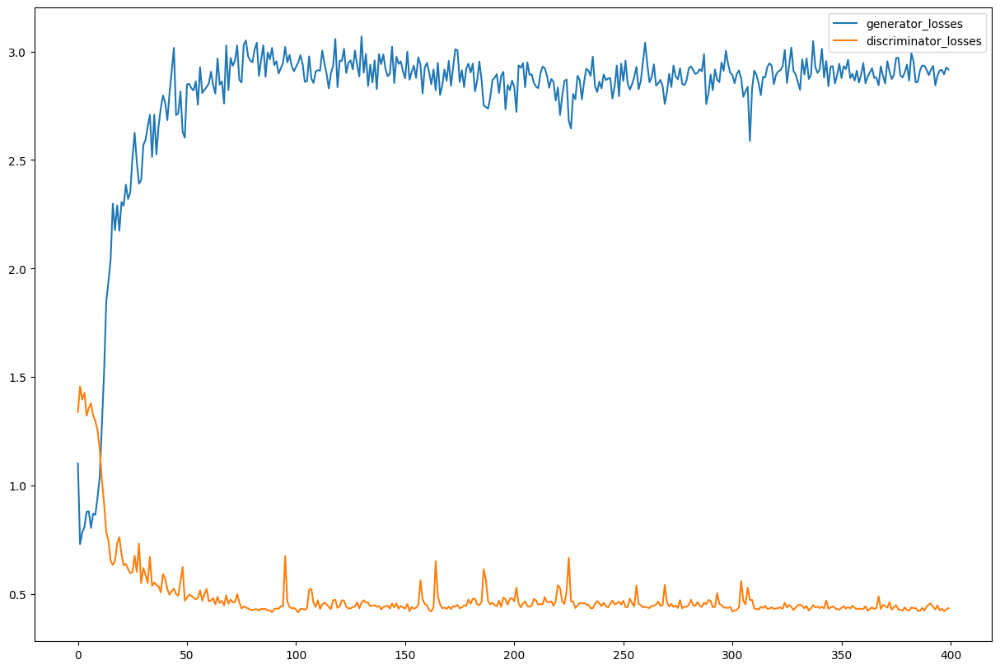

In [ ]:
plt.figure(figsize=(15, 10))
plt.plot(generator_losses, label="generator_losses")
plt.plot(discriminator_losses, label="discriminator_losses")
plt.legend()
plt.show()